<a href="https://colab.research.google.com/github/Jinwooseol/Deep-learning/blob/main/image_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import os

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

import matplotlib.image as plt_img
import matplotlib.pyplot as plt

# Load a dataset

Test file

In [ ]:
PATH = '/content/drive/MyDrive/인공지능 학습/Project/Image_classification'

test_PATH = PATH + '/test/test/0'

X_test = []
test_idx = []

for img in os.listdir(test_PATH):
  num = int(img.split('.')[0]) - 1
  print(num)
  X_test.append(plt_img.imread(test_PATH + '/' + img))
  test_idx.append(num)

Training file

In [3]:
img_class = {'dog':0, 'elephant':1, 'giraffe':2, 'guitar':3, 'horse':4, 'house':5, 'person':6}

train_PATH = PATH + '/train/train'

X_train = []
y_train = []
for cls in os.listdir(train_PATH):
  for img in os.listdir(train_PATH + '/' + cls):
    X_train.append(plt_img.imread(train_PATH + '/' + cls + '/' + img))
    y_train.append(img_class[cls])
    #print(img_class[cls])


In [73]:
print(test_idx)
X_test = np.array(X_test)
print(X_test.shape)

X_train = np.array(X_train)
y_train = pd.Series(np.array(y_train))

print(X_train.shape)
print(y_train.shape)
print(y_train.value_counts())

[29, 2, 6, 49, 26, 23, 7, 28, 12, 24, 22, 48, 1, 33, 8, 27, 3, 14, 10, 36, 30, 20, 40, 19, 11, 34, 31, 25, 9, 46, 18, 50, 13, 51, 42, 21, 44, 35, 39, 41, 38, 37, 43, 47, 32, 15, 17, 0, 4, 5, 45, 53, 52, 16, 106, 90, 94, 76, 85, 66, 115, 72, 57, 77, 86, 112, 95, 78, 102, 71, 64, 74, 114, 107, 56, 96, 117, 99, 111, 109, 60, 59, 113, 110, 103, 91, 70, 73, 108, 89, 101, 93, 92, 81, 69, 105, 54, 116, 55, 61, 79, 98, 88, 104, 87, 65, 68, 84, 80, 62, 82, 58, 67, 63, 100, 97, 83, 75, 128, 170, 165, 150, 141, 131, 162, 151, 129, 158, 175, 180, 133, 145, 134, 152, 132, 149, 139, 173, 166, 143, 136, 119, 160, 118, 177, 138, 181, 163, 146, 121, 174, 130, 120, 123, 161, 164, 125, 168, 179, 140, 147, 127, 124, 148, 153, 178, 126, 144, 176, 159, 157, 169, 156, 172, 154, 167, 142, 137, 135, 155, 171, 122, 195, 234, 237, 214, 230, 188, 183, 220, 197, 196, 198, 187, 228, 184, 185, 229, 225, 209, 193, 235, 215, 192, 191, 189, 219, 190, 241, 222, 240, 223, 212, 210, 199, 232, 203, 204, 233, 218, 207, 205,

# Data explorations

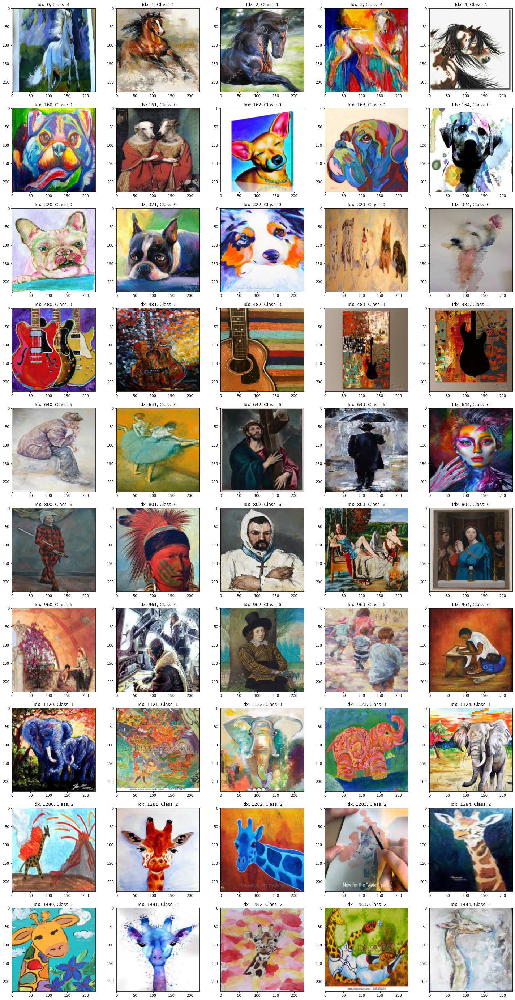

In [5]:
fig, axes = plt.subplots(10, 5, figsize = (25, 50))
for i in range(10):
  for j in range(5):
    axes[i][j].imshow(X_train[i*160 + j])
    axes[i][j].set_title('Idx: ' + str(i*160 + j) + ', Class: ' + str(y_train[i*160 + j]))

# Build model

In [77]:
mycb = [keras.callbacks.EarlyStopping('accuracy', patience = 5, restore_best_weights = True)]
eff = keras.applications.EfficientNetB1(weights='imagenet', include_top=False, input_shape = (227, 227, 3))
eff.trainable = False

model = keras.Sequential([
                          eff,
                          layers.Flatten(),
                          layers.Dense(256, activation = 'relu'),
                          layers.Dense(128, activation = 'relu'),
                          layers.Dense(64, activation = 'relu'),
                          layers.Dense(7)
])


model.compile(optimizer = 'adam',
              loss = keras.losses.SparseCategoricalCrossentropy(from_logits = True),
              metrics = ['accuracy'])

history = model.fit(X_train, y_train, epochs = 20, callbacks=mycb)

Epoch 1/20
54/54 [==============================] - 14s 103ms/step - loss: 1.6258 - accuracy: 0.7291
Epoch 2/20
54/54 [==============================] - 5s 100ms/step - loss: 0.5878 - accuracy: 0.8857
Epoch 3/20
54/54 [==============================] - 5s 100ms/step - loss: 0.1105 - accuracy: 0.9670
Epoch 4/20
54/54 [==============================] - 5s 101ms/step - loss: 0.0627 - accuracy: 0.9817
Epoch 5/20
54/54 [==============================] - 5s 101ms/step - loss: 0.0252 - accuracy: 0.9918
Epoch 6/20
54/54 [==============================] - 5s 98ms/step - loss: 0.0776 - accuracy: 0.9823
Epoch 7/20
54/54 [==============================] - 5s 99ms/step - loss: 0.0678 - accuracy: 0.9788
Epoch 8/20
54/54 [==============================] - 5s 98ms/step - loss: 0.0204 - accuracy: 0.9918
Epoch 9/20
54/54 [==============================] - 5s 98ms/step - loss: 0.0497 - accuracy: 0.9853
Epoch 10/20
54/54 [==============================] - 5s 100ms/step - loss: 0.0343 - accuracy: 0.9947
Ep

# Check loss & accuracy

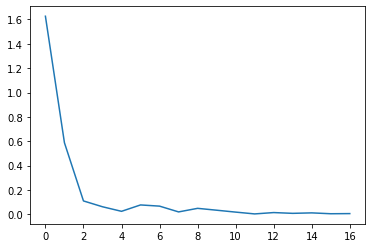

In [78]:
plt.plot(history.history['loss'])

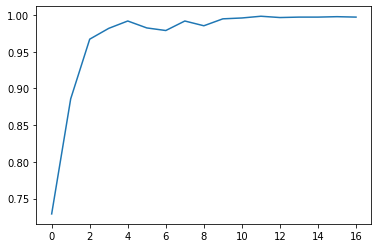

In [79]:
plt.plot(history.history['accuracy'])

# Prediction

In [80]:
predict = np.argmax(model.predict(X_test), axis = -1)
pred = pd.DataFrame(predict, index = test_idx, columns = ['answer value'])
pred.sort_index(inplace = True)
print(pred)
pred.to_csv('prediction.csv')

     answer value
0               6
1               3
2               2
3               3
4               3
..            ...
345             6
346             3
347             3
348             5
349             2

[350 rows x 1 columns]


# Check prediction

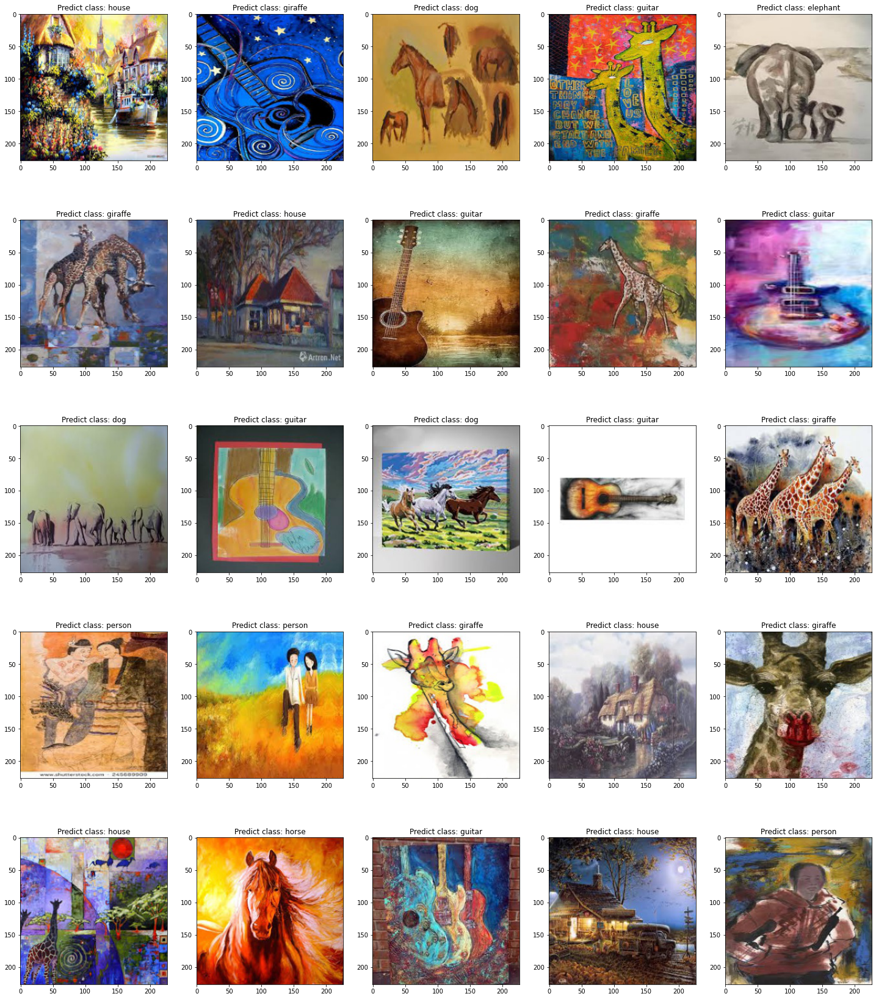

In [81]:
class_str = {0:'dog', 1:'elephant', 2:'giraffe', 3:'guitar', 4:'horse', 5:'house', 6:'person'}

fig, axes = plt.subplots(5, 5, figsize = (25, 30))
for i in range(5):
  for j in range(5):
    axes[i][j].imshow(X_test[i*10 + j])
    axes[i][j].set_title('Predict class: ' + class_str[pred.loc[test_idx[i*10 + j], 'answer value']])

# 결론
- 그림이 명확하거나 집, 사람 처럼 특정이 분명한 경우 분류가 잘 이루어졌다.
- 하지만, 말, 개, 코끼리 등 동물의 경우 비슷한 형태를 가지고 있으면 분류가 명확히 이루어 지지 않았다.